BBM409: Introduction to Machine Learning Lab.<br>

# Assignment 4 : Neural Network and Convolutional Neural Network (CNN)

This assignment has done by **Yunus Emre YAZICI** (Student ID: 21827981) and **Ali Kemal TAMKOÇ** (Student ID: 2200356856).


### Important Note

- Since our model files can not fit the submit system, we uploaded them to Google Drive. You can reach the saved model files from the link below: 
https://drive.google.com/drive/folders/1HIVDvYVX-LBYhn18uuhhCZt71gnrnNZe?usp=sharing
- The folder contains every best model from different activation functions and different layer numbers
- It also contains the best model among all the models and its trained version with 100 epochs

In [80]:
## Importing necessary modules

import os
import numpy as np
import matplotlib.pyplot as plt
from typing import Any
from PIL import Image

# Problem Definition and Data

In this problem we will try to predict the type of the vegatable from their image. We are going to use the dataset in this [link](https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset).

The dataset contains 15 vegatable classes named as follows:
1. Bean
2. Bitter_Gourd
3. Bottle_Gourd
4. Brinjal
5. Broccoli
6. Cabbage
7. Capsicum
8. Carrot
9. Cauliflower
10. Cucumber
11. Papaya
12. Potato
13. Pumpkin
14. Radish
15. Tomato

# Part 1: Multi Layer Neural Network

Below we implement each component of the multi layer neural network. Our implementation of neural network is scalable through stacking activation layers. These layers will be always followed up with a softmax layer.
Some notes of our report:
* We don't go into too much detail about how we found the matrix gradients but we explain the individual gradients.
* Our implementation of backwards call for calculating derivative w.r.t. (with respect to) loss function is implemented by multiplying next layers derivative w.r.t loss function. In other words, we favor from chain rule for calculating gradients. Example:
$$ \frac{dL}{dX} = \frac{dH}{dX}\frac{dL}{dH} \text{   Where $L$ is loss, $H$ is output and $X$ is the input}$$

## 1.1. Implementation

### 1.1.1 Activation Functions

In this assignment we were asked to use different activation functions. We choose using 3 different activation and 1 last layer activation function. Our last layer activation function is always **softmax** function and our layer activation functions are **relu, sigmoid, and tanh**.
<br><br>
Our implementation of activation functions follows the same system as the layers, each has a forward and backward function. We don't go into details of how we calculated their derivatives as they are frequently used functions in mathematics except from ReLU (to our knowladge).

#### ReLU

Our ReLU activation function can be defined as:
$$ f(x) = max(0, x)$$
<br>
And its derivative can be defined as:
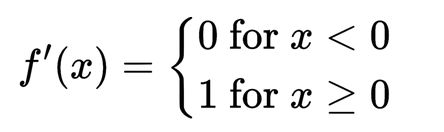

In [2]:
def relu(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the ReLU for forward activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    return np.maximum(0, Z)


def derivative_relu(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the ReLU for backward activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    return np.greater(Z, 0).astype(int)

#### Tanh

Our Tanh activation function can be defined as:
$$ f(x) = tanh(x)$$
<br>
However, with tanh activation, we might have some problem with too small values. So, we normalize the values in this operation.
<br>
And its derivative can be defined as:
$$f(x) = 1 - tanh(x)^2$$

In [3]:
def tanh(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the Tanh value for forward activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    z = np.tanh(Z)
    z = np.asarray(z)
    z[z < 1e-20] = 1e-20

    return z


def derivative_tanh(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the Tanh value for backward activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    Z = tanh(Z)
    Z = (1 - np.power(Z, 2))
    return Z

#### Sigmoid

Our Sigmoid activation function can be defined as:
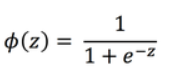
<br>
And its derivative can be defined as:
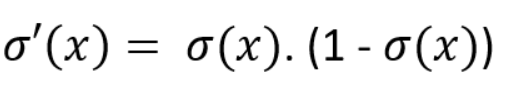

In [4]:
def sigmoid(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the Sigmoid value for forward activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    return 1 / (1 + np.exp(-Z))


def derivative_sigmoid(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the Sigmoid value for backward activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    sigmo = sigmoid(Z)
    return sigmo * (1 - sigmo)

#### Softmax

Since we use Softmax function only as last layer activation function, we do not need its derivative. Our softmax activation function can be defined as:
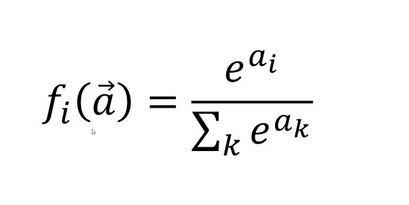

In [5]:
def softmax(Z: np.ndarray) -> np.ndarray:
    """
    Calculates the Softmax value for last layer activation 

    Args:
        Z (np.ndarray): input, shape (N,D)
    Returns:
        (np.ndarray): output, shape (N,D)
    """
    Z = np.exp(Z - np.max(Z))
    return Z / np.sum(Z, axis=0)

### 1.1.2 Utility

Utility functions are mainly used for reading the data, saved models as well as saving them to the specified path. If there is saved data files, it captures those files and reads from save files, instead of reading the images again. It makes the operation faster and reduces the load time.
<br><br>
While reading the data, before returning it, we mix them with using numpy function.

In [6]:
def read(data_set_folder: str = "Vegetable Images", mode: str = "train", model_name: str = None) -> Any:
    """
    Reads the data or given model from specified path
    If there is saved files, reads the data from those files
    This makes the process much faster
    If not, reads the files from the sources

    Args:
        data_set_folder (str): Folder name where all the files (test/train/validation) are in
        mode (str): Specifies which files it tries to read, can be test, train, validation and model
        model_name (str): In case of reading a saved model, specifies the model's file name without extension
    Returns:
        tuple[Any, Any]: Returns 2 np.arrays when it reads the image files
        Model: Returns a model, when it reads a saved model file
    """
    print(f"Trying to load {mode} files from previous saves")
    if model_name:
        try:
            model_params = load(mode=mode, model_name=model_name)
            return model_params
        except FileNotFoundError:
            print(f"There is not any file save for {model_name}")
    else:
        try:
            X, Y = load(mode=mode)
        except FileNotFoundError:
            print(f"Could not find {mode} save files")
            print("Reading the files from the source")
            # Sets the path properly depending on the mode and data set folder
            path = os.path.join(os.getcwd(), data_set_folder)
            path = os.path.join(path, mode)
            directories = [name for name in os.listdir(path)]

            X, Y = [], []
            for i in range(len(directories)):
                dir_path = os.path.join(path, directories[i])
                files = os.listdir(dir_path)
                for image in files:
                    im = Image.open(dir_path + "\\" + image)
                    im = im.resize((120, 120))
                    # Converts the images in gray scale
                    im = im.convert('L')
                    # PIL to numpy array
                    data = np.asarray(im)
                    data = data.flatten()
                    data = np.divide(data, 255)
                    X.append(data)
                    Y.append(i)
            
            # Mixes the data before sending it to the model
            X = np.array(X, dtype=float)
            Y = np.array(Y, dtype=int)
            save(X, path=mode + "_X")
            save(Y, path=mode + "_Y")

        return _randomize(X, Y)


def _randomize(X: np.array, Y: np.array) -> tuple[Any, Any]:
    """
    After reading the data from either source or saved files, it mixes the arrays for better training

    Args:
        X (np.array): Folder name where all the files (test/train/validation) are in
        Y (np.array): Specifies which files it tries to read, can be test, train, validation and model
    Returns:
        tuple[Any, Any]: Returns both mixed X and Y np.arrays
    """
    randomize = np.arange(len(X))
    np.random.shuffle(randomize)
    X = X[randomize]
    Y = Y[randomize]

    return X, Y


def load(mode: str = "train", model_name: str = None) -> Any:
    """
    Tries to load X and Y files for training, testing or validation
    If it is a model, loads the model

    Args:
        mode (str): Mode name such as train, test, validation
        model_name (str): Saved model file's name, unless trying to load a model, leave it None
    Returns:
        Any: Returns X and Y np.arrays for datas, or a model
    """
    if not model_name:
        X, Y = [], []
        if os.path.exists('models/' + mode + "_X.npy"):
            if mode == "train":
                X = _load(mode=mode, is_X=True)
                Y = _load(mode=mode, is_X=False)
            elif mode == "validation":
                X = _load(mode=mode, is_X=True)
                Y = _load(mode=mode, is_X=False)
            elif mode == "test":
                X = _load(mode=mode, is_X=True)
                Y = _load(mode=mode, is_X=False)
        else:
            raise FileNotFoundError(f"Specified {mode} files cannot be found")
        return np.array(X, dtype=float), np.array(Y, dtype=int)

    else:
        if os.path.exists('models/' + f"{model_name}.npy"):
            model_params = _load(mode=mode, model_name=model_name)
            model_params = model_params.item()
        else:
            raise FileNotFoundError(f"Specified {mode} files cannot be found")
        return model_params


def _load(mode: str = "train", is_X: bool = True, model_name: str = None) -> np.array:
    """
    Helper function for load() function
    Makes the actual loading with numpy

    Args:
        mode (str): Mode name such as train, test, validation
        is_X (bool): Specifies if the data is X or Y
        model_name (str): Saved model file's name, unless trying to load a model, leave it None
    Returns:
        np.array: Returns the read data
    """
    path = os.path.join(os.getcwd(), "models")
    if not model_name:
        if is_X:
            path = os.path.join(path, mode + "_X.npy")
        else:
            path = os.path.join(path, mode + "_Y.npy")
    else:
        path = os.path.join(path, f"{model_name}.npy")
    
    with open(path, "rb") as f:
        return np.load(f, allow_pickle=True)


def load_model(model_name: str) -> Any:
    """
    Loads a model

    Args:
        mode (str): Mode name such as train, test, validation
        is_X (bool): Specifies if the data is X or Y
        model_name (str): Saved model file's name, unless trying to load a model, leave it None
    Returns:
        np.array: Returns the read data
    """
    load_model_params = read(mode="model", model_name=model_name)
    if load_model_params:
        return load_model_params

In [7]:
def save(arr: Any, name: str = "model", is_model: bool = False) -> None:
    """
    Saves the read data for later usages
    Or a trained model to load up later
    Saves in .npy format
    
    Args:
        arr (Any): Either a np.array for data or Model
        name (str): The name for the save
        is_model (bool): Specifies if the data given is a model
        
    Returns:
    """
    if not os.path.exists("models"):
        os.makedirs("models")

    if is_model:
        features = {
            "params": arr[0].params,
            "num_epoch": arr[0].num_epoch,
            "batch_size": arr[1],
            "activation_func": arr[2],
            "learning_rate": arr[3],
            "layer_set": arr[4]
        }
        arr = features
        
    np.save(f"models/{name}.npy", arr)

Some other utility functions to get the predictions from the model and test the accuracy.
<br><br>
*draw_graphs* function plots a graph for the given loss, accuracy list by using matplotlib library.

In [8]:
def get_predictions(data: np.array) -> np.array:
    """
    Return the predictions
    If there is a negative prediction, makes it equal to 0
    Args:
        data (np.array): The predictions which are made by the model
        
    Returns:
        np.array: Result
    """
    return np.argmax(data, 0)


def get_accuracy(predictions, Y):
    """
    Calculates the accuracy
    Args:
        predictions (np.array): The predictions which are made by the model
        Y (np.array): The actual values from the data
        
    Returns:
        float: The result over 100
    """
    return 100 * np.sum(predictions == Y) / Y.size


def draw_graphs(accuracy: list, loss: list) -> None:
    """
    Draws 2 graphs for accuracy list and loss list to show the relation between them and epoch number
    Args:
        accuracy (list): The accuracy values from every epoch of a model
        loss (list): The loss values from every epoch of a model
        
    Returns:
    """
    fig, axs = plt.subplots(2,1)
    fig.set_size_inches(7, 9)
    axs[0].plot( list(range(len(loss))), loss)
    axs[0].set(xlabel="Epoch", ylabel="Average Training Loss")

    axs[1].plot( list(range(len(accuracy))), accuracy)
    axs[1].set(xlabel="Epoch", ylabel="Average Training Accuracy")

    plt.subplots_adjust(wspace=0.01, hspace=0.4)

### 1.1.3 Model Implementation

In [83]:
class Model:
    def __init__(self, layer_dims: list = None, learning_rate: float = 0.002, num_epoch: int = 100, batch_size: int = 16, 
                 layer_activation: str = "relu", last_layer_act_func: str = "softmax", decay_rate: float = 0.998):
        """
        Initialize MultiLayerNeuralNetwork Model

        Args:
            layer_dims (list): An int list showing nodes for each layer, there should be at least 2 elements to create a model
            learning_rate (float): Learning rate of the model
            num_epoch (int): Number of epochs
            batch_size (int): Number of the batches
            layer_activation (str): Activation function that is going to be used for each hiden layer.
            last_layer_act_func (str): Activation function that is going to be used for the last layer.
            decay_rate (float): The values that is used for smoothing the training
        """
        self.layer_dims = layer_dims
        self.learning_rate = learning_rate
        self.num_epoch = num_epoch
        self.batch_size = batch_size
        self.layer_activation = layer_activation
        self.last_layer_act_func = last_layer_act_func
        self.decay_rate = decay_rate
        self.params = {}
        self.num_batch = 0
        self.current_batch = 0
        self.avg_acc = 0
        self.avg_loss = 0
        self.init_params()

    def init_params(self):
        """
        Sets the initial weights and biases for the model

        Args:
        Returns:
        """
        np.random.seed(42)

        for i in range(1, len(self.layer_dims)):
            self.params['W' + str(i)] = np.random.randn(self.layer_dims[i], self.layer_dims[i - 1]) * 0.001
            self.params['b' + str(i)] = np.zeros((self.layer_dims[i], 1))

    def forward_activation(self, Z: np.array, activation: str) -> Any:
        """
        A helper function to forward the activations depending on the model

        Args:
            Z (np.array): The data
            activation (str): The activation that is being used
        Returns:
            Any: Depends on the activation function that is being used
        """
        if activation == "sigmoid":
            return sigmoid(Z)
        elif activation == "relu":
            return relu(Z)
        elif activation == "softmax":
            return softmax(Z)
        elif activation == "tanh":
            return tanh(Z)

    def backward_activation(self, Z: np.array) -> Any:
        """
        A helper function to forward the activations depending on the model

        Args:
            Z (np.array): The data
        Returns:
            Any: Depends on the activation function that is being used
        """
        if self.layer_activation == "sigmoid":
            return derivative_sigmoid(Z)
        elif self.layer_activation == "relu":
            return derivative_relu(Z)
        elif self.layer_activation == "tanh":
            return derivative_tanh(Z)


    def forward(self, X: np.array) -> tuple[Any, Any]:
        """
        Forward activation function
        Makes the corresponding calculations and returns the results

        Args:
            X (np.array): The data
        Returns:
            Tuple[dict, dict]: Returns the tuple of layer_result and activation_result
        """
        layer_result = {}
        activation_result = {"A0": X}
        len_of_layer = len(self.layer_dims)
        for i in range(1, len_of_layer - 1):
            layer_result["Z" + str(i)] = np.dot(self.params['W' + str(i)], activation_result['A' + str(i - 1)]) + \
                                         self.params['b' + str(i)]
            activation_result["A" + str(i)] = self.forward_activation(layer_result["Z" + str(i)], self.layer_activation)

        layer_result["Z" + str(len_of_layer - 1)] = np.dot(self.params['W' + str(len_of_layer - 1)],
                                                           activation_result["A" + str(len_of_layer - 2)]) + \
                                                    self.params['b' + str(len_of_layer - 1)]
        activation_result["A" + str(len_of_layer - 1)] = self.forward_activation(
            layer_result["Z" + str(len_of_layer - 1)], self.last_layer_act_func)

        return layer_result, activation_result

    def backward(self, layer_result: dict, activation_result: dict, Y: np.array) -> dict:
        """
        Backward activation function
        Makes the corresponding calculations and returns the results

        Args:
            layer_result (dict): The layer calculations from forward activation
            activation_result (dict): The activation calculations from forward activation
            Y (np.array): The data batch from images corresponds to their classes
        Returns:
            derivate_results (dict): Returns the result of derivations
        """
        derivate_results = {}
        one_hot_Y = self.one_hot_encoding(Y)

        derivate_results["dZ" + str(len(self.layer_dims) - 1)] = activation_result[
                                                                     "A" + str(len(self.layer_dims) - 1)] - one_hot_Y
        derivate_results["dW" + str(len(self.layer_dims) - 1)] = (1 / self.batch_size) * np.dot(
            derivate_results["dZ" + str(len(self.layer_dims) - 1)],
            activation_result["A" + str(len(self.layer_dims) - 2)].T)
        derivate_results["db" + str(len(self.layer_dims) - 1)] = (1 / self.batch_size) * np.sum(
            derivate_results["dZ" + str(len(self.layer_dims) - 1)])

        for i in range(len(self.layer_dims) - 1, 1, -1):
            derivate_results["dZ" + str(i - 1)] = np.dot(self.params["W" + str(i)].T,
                                                         derivate_results["dZ" + str(i)]) * self.backward_activation(
                layer_result["Z" + str(i - 1)])
            derivate_results["dW" + str(i - 1)] = (1 / self.batch_size) * np.dot(derivate_results["dZ" + str(i - 1)],
                                                                                 activation_result["A" + str(i - 2)].T)
            derivate_results["db" + str(i - 1)] = (1 / self.batch_size) * np.sum(derivate_results["dZ" + str(i - 1)])

        return derivate_results

    def optimize(self, derivative_results: dict) -> None:
        """
        Depending on the backward activation results
        Optimizes and updates the weights and biases to have a better model
        Uses the decay rate for smoothing the result
        
        Args:
            derivative_results (dict): The derivative calculations from backward activation
        Returns:
        """
        for i in range(len(self.layer_dims) - 1):
            self.params["W" + str(i + 1)] -= (
                    self.learning_rate * derivative_results["dW" + str(i + 1)]) * self.decay_rate
            self.params["b" + str(i + 1)] -= (
                    self.learning_rate * derivative_results["db" + str(i + 1)]) * self.decay_rate

    def train(self, train_X: np.array, train_Y: np.array, valid_X: np.array, valid_Y: np.array) -> tuple[list, list]:
        """
        Train function for the model
        Uses training and validation data set while training
        Measures the accuracy and loss from validation data
        
        Args:
            train_X (np.array): The training data from the images
            train_Y (np.array): The training classes from the images
            valid_X (np.array): The validation data from the images
            valid_Y (np.array): The validation classes from the images
        Returns:
            tuple[list, list]: return accracy_list and loss_list from epochs to draw a graph later
        """
        loss_list = []
        accuracy_list = []
        for i in range(self.num_epoch):
            total_loss = 0
            self.num_batch = train_X.shape[0] // self.batch_size
            self.current_batch = 0
            while self.current_batch < self.num_batch:
                current_batch_X, current_batch_Y = self.get_next_batch(train_X, train_Y)
                
                layer_result, activation_result = self.forward(current_batch_X)
                derivate_results = self.backward(layer_result, activation_result, current_batch_Y)
                self.optimize(derivate_results)
                total_loss += self.compute_loss(current_batch_Y, activation_result["A" + str(len(activation_result) - 1)])

            _, valid_activation_result = self.forward(valid_X.T)
            predictions = get_predictions(valid_activation_result["A" + str(len(self.layer_dims) - 1)])
            acc = get_accuracy(predictions, valid_Y)
            accuracy_list.append(acc)
            loss_list.append(total_loss)

            print(f"Epoch {i + 1}/{self.num_epoch}\tAccuracy: {acc}\tTotal Loss: {total_loss}")
        self.avg_acc = np.average(accuracy_list)
        self.avg_loss = np.average(loss_list)
        return accuracy_list, loss_list
    
    def get_next_batch(self, train_X: np.array, train_Y: np.array) -> tuple[np.array, np.array]:
        """
        When it is called depending on the current batch and the batch size returns the next corresponding batch
        
        Args:
        Returns:
            tuple[np.array, np.array]: return accracy_list and loss_list from epochs to draw a graph later
        """
        begin = self.current_batch * self.batch_size
        end = begin + self.batch_size
        self.current_batch += 1
                
        return train_X.T[:, begin:end], train_Y[begin:end]
        
    def predict(self, test_X: np.array, test_Y: np.array) -> np.array:
        """
        Prediction functions to test the test data
        Measures the accuracy after predicting the values

        Args:
            test_X (np.array): The data from test images
            test_Y (np.array): The classes from test images
        Returns:
            predictions (np.array): Predictions
        """
        _, test_activation_result = self.forward(test_X.T)
        predictions = get_predictions(test_activation_result["A" + str(len(self.layer_dims) - 1)])
        acc = get_accuracy(predictions, test_Y)
        print("Accuracy:", acc)
        return predictions

    def one_hot_encoding(self, Y: np.array) -> np.array:
        """
        Normalization function 

        Args:
            Y (np.array): The classes from images
        Returns:
            one_hot_Y (np.array): Normalized values
        """
        one_hot_Y = np.zeros((Y.size, self.layer_dims[-1]))
        one_hot_Y[np.arange(Y.size), Y] = 1
        one_hot_Y = one_hot_Y.T
        return one_hot_Y

    def compute_loss(self, train_Y: np.array, last_Activation: np.array) -> float:
        """
        Calculates negative log likelihood loss 

        Args:
            train_Y (np.array): The classes from train images
            last_Activation (np.array): The results from last activation function
        Returns:
            (float): Loss value from the last activation
        """
        train_Y = self.one_hot_encoding(train_Y)
        L_sum = np.sum(np.multiply(train_Y, np.log(last_Activation)))
        m = train_Y.shape[1]
        return -(1. / m) * L_sum

    def display(self):
        """
        Displays the features of the current model

        Args:
        Returns:
        """
        print(f"Layer settings: {self.layer_dims}")
        print(f"Learning rate: {self.learning_rate}")
        print(f"Number of Epoch: {self.num_epoch}")
        print(f"Batch Size: {self.batch_size}")
        print(f"Layer Activation: {self.layer_activation}")
        print(f"Last Layer Activation: {self.last_layer_act_func}")
        print(f"Decay rate: {self.decay_rate}")

## 1.2. Testing

As it is stated in the assignment, we are asked to train different models with different settings. We tested our implementations with every different setting.
<br><br>
We have 3 different layer activation functions: Sigmoid, ReLU, Tanh
<br>
We set batch sizes as: 16, 32, 64, 128. 
<br>
We have 3 different learning rates: 0.005, 0.01, 0.02
<br>
Our number of classes are: 15.
<br>
We train our model with: 0, 1, and 2 layers.
<br>
Our epoch size for the training and finding the best model is 10.
<br>
In order to avoid RAM problem, we resize our images to 120x120.
<br><br>
Since it is first layer includes all the entry points it has 120x120 nodes. Our last layer (output layer) has 15 nodes, since we have 15 different classes

In [20]:
BATCH_SIZES = [16, 32, 64, 128]
DECAY_RATE = 0.998
EPOCH_SIZE = 10
LEARNING_RATES = [5e-3, 1e-2, 2e-2]
NUM_OF_CLASSES = 15
LAYER_DIMS = [120 * 120, 15]

train_X, train_Y = read(data_set_folder="Vegetable Images", mode="train")
valid_X, valid_Y = read(data_set_folder="Vegetable Images", mode="validation")
test_X, test_Y = read(data_set_folder="Vegetable Images", mode="test")

best_model = (Model, 0, "", 0.0, [], 0)
best_models = []

Trying to load train files from previous saves
Trying to load validation files from previous saves
Trying to load test files from previous saves


In [8]:
def run(activation_func, layer_dims):
    global best_model
    for batch_size in BATCH_SIZES:
        for learning_rate in LEARNING_RATES:
            print(f"\n{len(layer_dims)-2}-Layer Model is being trained")
            print(f"Batch size: {batch_size}")
            print(f"Activation function: {activation_func}")
            print(f"Learning rate: {learning_rate}")
            print(f"Layer dims: {layer_dims}\n")

            model = Model(layer_dims=layer_dims, learning_rate=learning_rate, num_epoch=EPOCH_SIZE,
                          batch_size=batch_size, layer_activation=activation_func, last_layer_act_func="softmax")
            model.train(train_X, train_Y, valid_X, valid_Y)

            if best_model[-1] < model.avg_acc:
                del best_model
                best_model = (model, batch_size, activation_func, learning_rate, layer_dims, model.avg_acc)
            else:
                del model

    print(f"\nTesting with the best hyper-parameters on the model with {len(layer_dims)-2} hidden layers")
    best_model = best_model[0]
    save(best_model, name=f"{len(layer_dims)-2}-{activation_func}-layer-model")
    best_model.predict(test_X, test_Y)
    best_models.append(best_model)
    best_model = (Model, 0, "", 0.0, [], 0)

## 1.2.1. Training With Different Settings

### 1.2.1.1. 0-Layer Traning

In [9]:
activation_func = "sigmoid"
run(activation_func, LAYER_DIMS)


0-Layer Model is being trained
Batch size: 16
Activation function: sigmoid
Learning rate: 0.005
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 23.7	Total Loss: 2819.8726152060112
Epoch 2/10	Accuracy: 26.333333333333332	Total Loss: 2553.6919177622863
Epoch 3/10	Accuracy: 27.133333333333333	Total Loss: 2433.734428678261
Epoch 4/10	Accuracy: 28.2	Total Loss: 2349.075522140533
Epoch 5/10	Accuracy: 28.766666666666666	Total Loss: 2281.9280617235668
Epoch 6/10	Accuracy: 29.433333333333334	Total Loss: 2225.658075734811
Epoch 7/10	Accuracy: 29.566666666666666	Total Loss: 2176.8626128579986
Epoch 8/10	Accuracy: 29.866666666666667	Total Loss: 2133.540485061703
Epoch 9/10	Accuracy: 30.466666666666665	Total Loss: 2094.430702096285
Epoch 10/10	Accuracy: 31.066666666666666	Total Loss: 2058.6918222196923

0-Layer Model is being trained
Batch size: 16
Activation function: sigmoid
Learning rate: 0.01
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 21.566666666666666	Total Loss: 5726.862579248611
Epoch 2/1

Epoch 5/10	Accuracy: 24.766666666666666	Total Loss: 308.77696649496164
Epoch 6/10	Accuracy: 25.566666666666666	Total Loss: 302.8612231195381
Epoch 7/10	Accuracy: 27.6	Total Loss: 298.3964981544476
Epoch 8/10	Accuracy: 26.733333333333334	Total Loss: 294.5312828893718
Epoch 9/10	Accuracy: 27.433333333333334	Total Loss: 290.9611769406431
Epoch 10/10	Accuracy: 28.066666666666666	Total Loss: 287.2834761355623

0-Layer Model is being trained
Batch size: 128
Activation function: sigmoid
Learning rate: 0.02
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 12.066666666666666	Total Loss: 1313.1247448480644
Epoch 2/10	Accuracy: 14.966666666666667	Total Loss: 1000.3023185301263
Epoch 3/10	Accuracy: 21.066666666666666	Total Loss: 903.4374512902988
Epoch 4/10	Accuracy: 23.966666666666665	Total Loss: 920.2643912590413
Epoch 5/10	Accuracy: 19.533333333333335	Total Loss: 837.4026045979813
Epoch 6/10	Accuracy: 16.0	Total Loss: 811.4218995608088
Epoch 7/10	Accuracy: 22.0	Total Loss: 704.4597886182037
Epoch 

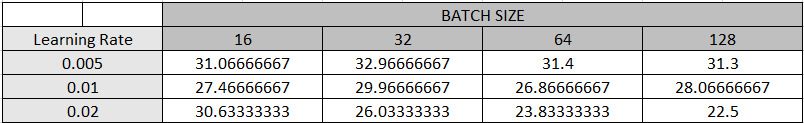

In [10]:
activation_func = "relu"
run(activation_func, LAYER_DIMS)


0-Layer Model is being trained
Batch size: 16
Activation function: relu
Learning rate: 0.005
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 23.7	Total Loss: 2819.8726152060112
Epoch 2/10	Accuracy: 26.333333333333332	Total Loss: 2553.6919177622863
Epoch 3/10	Accuracy: 27.133333333333333	Total Loss: 2433.734428678261
Epoch 4/10	Accuracy: 28.2	Total Loss: 2349.075522140533
Epoch 5/10	Accuracy: 28.766666666666666	Total Loss: 2281.9280617235668
Epoch 6/10	Accuracy: 29.433333333333334	Total Loss: 2225.658075734811
Epoch 7/10	Accuracy: 29.566666666666666	Total Loss: 2176.8626128579986
Epoch 8/10	Accuracy: 29.866666666666667	Total Loss: 2133.540485061703
Epoch 9/10	Accuracy: 30.466666666666665	Total Loss: 2094.430702096285
Epoch 10/10	Accuracy: 31.066666666666666	Total Loss: 2058.6918222196923

0-Layer Model is being trained
Batch size: 16
Activation function: relu
Learning rate: 0.01
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 21.566666666666666	Total Loss: 5726.862579248611
Epoch 2/10	Accu

Epoch 6/10	Accuracy: 25.566666666666666	Total Loss: 302.8612231195381
Epoch 7/10	Accuracy: 27.6	Total Loss: 298.3964981544476
Epoch 8/10	Accuracy: 26.733333333333334	Total Loss: 294.5312828893718
Epoch 9/10	Accuracy: 27.433333333333334	Total Loss: 290.9611769406431
Epoch 10/10	Accuracy: 28.066666666666666	Total Loss: 287.2834761355623

0-Layer Model is being trained
Batch size: 128
Activation function: relu
Learning rate: 0.02
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 12.066666666666666	Total Loss: 1313.1247448480644
Epoch 2/10	Accuracy: 14.966666666666667	Total Loss: 1000.3023185301263
Epoch 3/10	Accuracy: 21.066666666666666	Total Loss: 903.4374512902988
Epoch 4/10	Accuracy: 23.966666666666665	Total Loss: 920.2643912590413
Epoch 5/10	Accuracy: 19.533333333333335	Total Loss: 837.4026045979813
Epoch 6/10	Accuracy: 16.0	Total Loss: 811.4218995608088
Epoch 7/10	Accuracy: 22.0	Total Loss: 704.4597886182037
Epoch 8/10	Accuracy: 20.0	Total Loss: 769.66908866946
Epoch 9/10	Accuracy: 24.13

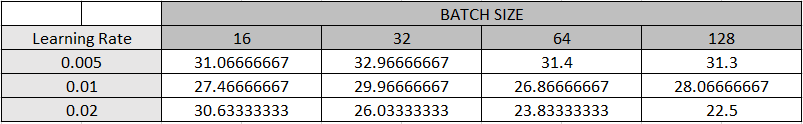

In [11]:
activation_func = "tanh"
run(activation_func, LAYER_DIMS)


0-Layer Model is being trained
Batch size: 16
Activation function: tanh
Learning rate: 0.005
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 23.7	Total Loss: 2819.8726152060112
Epoch 2/10	Accuracy: 26.333333333333332	Total Loss: 2553.6919177622863
Epoch 3/10	Accuracy: 27.133333333333333	Total Loss: 2433.734428678261
Epoch 4/10	Accuracy: 28.2	Total Loss: 2349.075522140533
Epoch 5/10	Accuracy: 28.766666666666666	Total Loss: 2281.9280617235668
Epoch 6/10	Accuracy: 29.433333333333334	Total Loss: 2225.658075734811
Epoch 7/10	Accuracy: 29.566666666666666	Total Loss: 2176.8626128579986
Epoch 8/10	Accuracy: 29.866666666666667	Total Loss: 2133.540485061703
Epoch 9/10	Accuracy: 30.466666666666665	Total Loss: 2094.430702096285
Epoch 10/10	Accuracy: 31.066666666666666	Total Loss: 2058.6918222196923

0-Layer Model is being trained
Batch size: 16
Activation function: tanh
Learning rate: 0.01
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 21.566666666666666	Total Loss: 5726.862579248611
Epoch 2/10	Accu

Epoch 6/10	Accuracy: 25.566666666666666	Total Loss: 302.8612231195381
Epoch 7/10	Accuracy: 27.6	Total Loss: 298.3964981544476
Epoch 8/10	Accuracy: 26.733333333333334	Total Loss: 294.5312828893718
Epoch 9/10	Accuracy: 27.433333333333334	Total Loss: 290.9611769406431
Epoch 10/10	Accuracy: 28.066666666666666	Total Loss: 287.2834761355623

0-Layer Model is being trained
Batch size: 128
Activation function: tanh
Learning rate: 0.02
Layer dims: [14400, 15]

Epoch 1/10	Accuracy: 12.066666666666666	Total Loss: 1313.1247448480644
Epoch 2/10	Accuracy: 14.966666666666667	Total Loss: 1000.3023185301263
Epoch 3/10	Accuracy: 21.066666666666666	Total Loss: 903.4374512902988
Epoch 4/10	Accuracy: 23.966666666666665	Total Loss: 920.2643912590413
Epoch 5/10	Accuracy: 19.533333333333335	Total Loss: 837.4026045979813
Epoch 6/10	Accuracy: 16.0	Total Loss: 811.4218995608088
Epoch 7/10	Accuracy: 22.0	Total Loss: 704.4597886182037
Epoch 8/10	Accuracy: 20.0	Total Loss: 769.66908866946
Epoch 9/10	Accuracy: 24.13

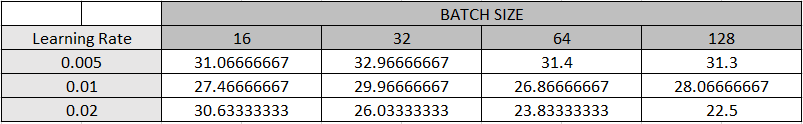

### General Conculusions
1. We can see that regardless of the batch size, every time we increased the learning rate, the accuracy went down. This might result from missing the points as we increase the learning rate.
<br>
2. As we increase the batch size, it had a mix effect for our models. However, it seems like the best performed batch size was 32 with learning rate 0.005 for all of our models.
<br>
3. We see that the average accuracy in all settings are relatively low compared to our best model. This can be explained with several reasons:
- Since this architecture doesn't contain any activation functions, it can't learn non-linear functions. Hence resulting in poor performance overall.
- Similarly, since this architecture contains only one linear layer which has output shape of 15 it can't learn complex enough functions.
4. Since there is no layer between output and input, all the models uses only softmax function. So, they result exactly the same.

### 1.2.1.2. 1-Layer Traning

In [32]:
LAYER_DIMS = [120*120, 256, 15]

In [13]:
activation_func = "sigmoid"
run(activation_func, LAYER_DIMS)


1-Layer Model is being trained
Batch size: 16
Activation function: sigmoid
Learning rate: 0.005
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 6.666666666666667	Total Loss: 2541.3555558309517
Epoch 2/10	Accuracy: 12.566666666666666	Total Loss: 2537.090829762707
Epoch 3/10	Accuracy: 14.3	Total Loss: 2520.9644007532656
Epoch 4/10	Accuracy: 15.766666666666667	Total Loss: 2490.556336781818
Epoch 5/10	Accuracy: 18.033333333333335	Total Loss: 2442.568981579961
Epoch 6/10	Accuracy: 20.066666666666666	Total Loss: 2387.95264619327
Epoch 7/10	Accuracy: 20.533333333333335	Total Loss: 2345.6619929534027
Epoch 8/10	Accuracy: 21.133333333333333	Total Loss: 2314.76781351409
Epoch 9/10	Accuracy: 22.133333333333333	Total Loss: 2289.194085767265
Epoch 10/10	Accuracy: 23.466666666666665	Total Loss: 2265.62671033168

1-Layer Model is being trained
Batch size: 16
Activation function: sigmoid
Learning rate: 0.01
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 7.5	Total Loss: 2541.2920010559615
Epoch

Epoch 3/10	Accuracy: 6.666666666666667	Total Loss: 316.9967922195471
Epoch 4/10	Accuracy: 6.666666666666667	Total Loss: 316.95365714774493
Epoch 5/10	Accuracy: 6.633333333333334	Total Loss: 316.87620485062394
Epoch 6/10	Accuracy: 6.566666666666666	Total Loss: 316.7382409468395
Epoch 7/10	Accuracy: 9.6	Total Loss: 316.5063817242172
Epoch 8/10	Accuracy: 11.633333333333333	Total Loss: 316.1515904392778
Epoch 9/10	Accuracy: 12.333333333333334	Total Loss: 315.6620196339252
Epoch 10/10	Accuracy: 11.533333333333333	Total Loss: 315.0420254294644

1-Layer Model is being trained
Batch size: 128
Activation function: sigmoid
Learning rate: 0.02
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 6.666666666666667	Total Loss: 317.1670968949601
Epoch 2/10	Accuracy: 6.666666666666667	Total Loss: 317.11133787373967
Epoch 3/10	Accuracy: 7.366666666666666	Total Loss: 316.9267645067496
Epoch 4/10	Accuracy: 10.033333333333333	Total Loss: 316.4293773209865
Epoch 5/10	Accuracy: 10.766666666666667	Total Loss:

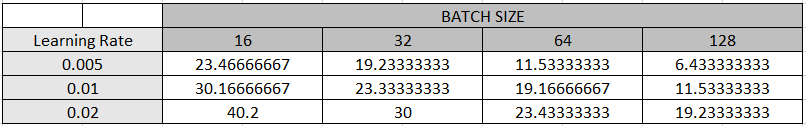

1. While using Sigmoid activation function for 1-Layer NN, we can clearly see that increasing the learning rate has a positive effect on the results.
<br>
2. At the same time, increasing the batch size makes the results much worse and decreases the accuracy.
<br>
3. Our best model here has the lowest batch size and the highest learning rate. It's accuracy is 40.2% with validation data
<br>
4. When we test the best model from this activation functions, it has 38.5% accuracy rate with our test data

In [14]:
activation_func = "relu"
run(activation_func, LAYER_DIMS)


1-Layer Model is being trained
Batch size: 16
Activation function: relu
Learning rate: 0.005
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 11.833333333333334	Total Loss: 2522.677973635753
Epoch 2/10	Accuracy: 16.266666666666666	Total Loss: 2417.6165893365524
Epoch 3/10	Accuracy: 19.7	Total Loss: 2343.417733551298
Epoch 4/10	Accuracy: 24.166666666666668	Total Loss: 2272.836222600643
Epoch 5/10	Accuracy: 26.9	Total Loss: 2198.19286831192
Epoch 6/10	Accuracy: 29.833333333333332	Total Loss: 2122.0412442717447
Epoch 7/10	Accuracy: 32.733333333333334	Total Loss: 2043.730088393976
Epoch 8/10	Accuracy: 35.333333333333336	Total Loss: 1962.1897021195753
Epoch 9/10	Accuracy: 37.53333333333333	Total Loss: 1879.2337122568902
Epoch 10/10	Accuracy: 39.13333333333333	Total Loss: 1798.7748226435408

1-Layer Model is being trained
Batch size: 16
Activation function: relu
Learning rate: 0.01
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 15.766666666666667	Total Loss: 2478.4386681837213
Epoch 2

Epoch 5/10	Accuracy: 13.633333333333333	Total Loss: 305.08160616574725
Epoch 6/10	Accuracy: 14.266666666666667	Total Loss: 301.854132895932
Epoch 7/10	Accuracy: 15.533333333333333	Total Loss: 299.42094917867564
Epoch 8/10	Accuracy: 16.7	Total Loss: 296.8074678303202
Epoch 9/10	Accuracy: 17.4	Total Loss: 294.51610003873174
Epoch 10/10	Accuracy: 17.933333333333334	Total Loss: 292.5889023443495

1-Layer Model is being trained
Batch size: 128
Activation function: relu
Learning rate: 0.02
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 7.066666666666666	Total Loss: 316.62094677024305
Epoch 2/10	Accuracy: 12.833333333333334	Total Loss: 313.3028414356238
Epoch 3/10	Accuracy: 14.1	Total Loss: 304.1039110644523
Epoch 4/10	Accuracy: 16.8	Total Loss: 298.81782805344614
Epoch 5/10	Accuracy: 17.633333333333333	Total Loss: 294.17577907357065
Epoch 6/10	Accuracy: 19.666666666666668	Total Loss: 290.0825148996047
Epoch 7/10	Accuracy: 22.3	Total Loss: 285.4249353024903
Epoch 8/10	Accuracy: 24.6333333

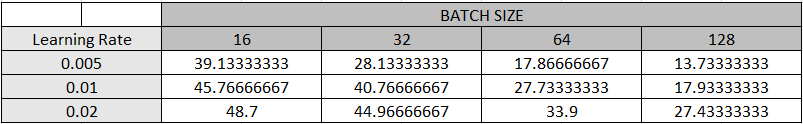

1. While using ReLU activation function for 1-Layer NN, we can clearly see that increasing the learning rate has the same positive effect on the results as Sigmoid 1 Layer NN.
<br>
2. At the same time, increasing the batch size also makes the results worse and decreases the accuracy. However, this time, compare to Sigmoid 1-Layer NN, batch size has slightly less effect.
<br>
3. Our best model here again has the lowest batch size and the highest learning rate. It's accuracy is 48.2% with validation data
<br>
4. When we test the best model from this activation functions, it has 48.1% accuracy rate with our test data

In [33]:
activation_func = "tanh"
run(activation_func, LAYER_DIMS)


1-Layer Model is being trained
Batch size: 16
Activation function: tanh
Learning rate: 0.005
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 10.733333333333333	Total Loss: 2530.608613447044
Epoch 2/10	Accuracy: 13.766666666666667	Total Loss: 2499.672563276938
Epoch 3/10	Accuracy: 12.966666666666667	Total Loss: 2489.557225716312
Epoch 4/10	Accuracy: 13.6	Total Loss: 2491.100606642794
Epoch 5/10	Accuracy: 13.133333333333333	Total Loss: 2493.7673525732203
Epoch 6/10	Accuracy: 11.033333333333333	Total Loss: 2496.0898556121265
Epoch 7/10	Accuracy: 10.633333333333333	Total Loss: 2498.330737635341
Epoch 8/10	Accuracy: 11.033333333333333	Total Loss: 2500.291960509232
Epoch 9/10	Accuracy: 10.3	Total Loss: 2501.930909783707
Epoch 10/10	Accuracy: 10.2	Total Loss: 2503.2685769775517

1-Layer Model is being trained
Batch size: 16
Activation function: tanh
Learning rate: 0.01
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 13.133333333333333	Total Loss: 2519.453959899141
Epoch 2/10	Accuracy: 

Epoch 7/10	Accuracy: 14.1	Total Loss: 311.2177332086727
Epoch 8/10	Accuracy: 13.366666666666667	Total Loss: 310.7890442970799
Epoch 9/10	Accuracy: 13.733333333333333	Total Loss: 310.6157482911066
Epoch 10/10	Accuracy: 13.766666666666667	Total Loss: 310.6157553238418

1-Layer Model is being trained
Batch size: 128
Activation function: tanh
Learning rate: 0.02
Layer dims: [14400, 256, 15]

Epoch 1/10	Accuracy: 7.0	Total Loss: 316.6684942885795
Epoch 2/10	Accuracy: 10.833333333333334	Total Loss: 315.2254889548541
Epoch 3/10	Accuracy: 12.9	Total Loss: 312.61925564254227
Epoch 4/10	Accuracy: 13.733333333333333	Total Loss: 311.08156836470727
Epoch 5/10	Accuracy: 13.766666666666667	Total Loss: 310.65300628615876
Epoch 6/10	Accuracy: 13.2	Total Loss: 310.76405521826496
Epoch 7/10	Accuracy: 13.133333333333333	Total Loss: 310.9889714609678
Epoch 8/10	Accuracy: 12.433333333333334	Total Loss: 311.2205599850458
Epoch 9/10	Accuracy: 11.666666666666666	Total Loss: 311.4417456627994
Epoch 10/10	Accura

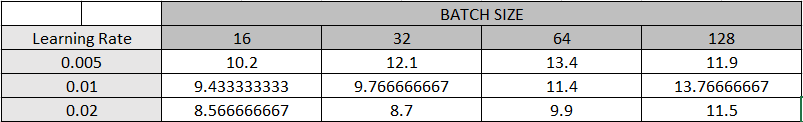

1. Between other activation functions, tanh has the worst accuracy results for 1-Layer NN.
<br>
2. In contrast of other activation functions, with tanh, increasing the learning rate has usually negative effect on the results.
<br>
3. At the same time, again in contrast, increasing the batch size makes the results better and increases the accuracy.
<br>
4. Our best model here has the lowest batch size and the highest learning rate. It's accuracy is ~13.8% with validation data
<br>
5. When we test the best model from this activation functions, it has 11.03% accuracy rate with our test data

### General Conculusions
- It looks like **higher** learning rate actually improved models performance (Except tanh models). 
- In tanh models, we think that in higher learning rate settings model overshooted and failed to converge to local minimum.  
- We see that **higher** batch size usually decreased in lower model performance. (Except tanh models).
- Among the activation functions, ReLU usually dominates, but this doesn't necessarily it is always the best. Since we only trained models for 10 epoch, we think that some activation functions may not have showed their potential due to initial epochs.
- This confusion between models might be caused by our implementation of activation functions. We tried to prevent 'exploding gradients' problem and implemented some other versions of activations functions.
<br><br>
In Python, floating point numbers are being representing with 64-bits. In gradient calculations, there are some numbers which are very big and when sigmoid starts to processing, because we take the square of the big numbers such as at above line of code, it causes some results which are bigger than 64-bits thus, it causes overflow errors. This is called as `exploding gradients`. It causes nan values and this should affects to our accuracy results badly.

### 1.2.1.3. 2-Layer Traning

In [34]:
LAYER_DIMS = [120*120, 256, 128, 15]

In [35]:
activation_func = "sigmoid"
run(activation_func, LAYER_DIMS)


2-Layer Model is being trained
Batch size: 16
Activation function: sigmoid
Learning rate: 0.005
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.666666666666667	Total Loss: 2539.9796931088667
Epoch 2/10	Accuracy: 6.666666666666667	Total Loss: 2540.0774840158692
Epoch 3/10	Accuracy: 6.666666666666667	Total Loss: 2540.0426416068262
Epoch 4/10	Accuracy: 6.666666666666667	Total Loss: 2540.0083101229393
Epoch 5/10	Accuracy: 6.666666666666667	Total Loss: 2539.9744924138136
Epoch 6/10	Accuracy: 6.666666666666667	Total Loss: 2539.941181109001
Epoch 7/10	Accuracy: 6.666666666666667	Total Loss: 2539.9083688752953
Epoch 8/10	Accuracy: 6.666666666666667	Total Loss: 2539.876048418794
Epoch 9/10	Accuracy: 6.666666666666667	Total Loss: 2539.8442124857997
Epoch 10/10	Accuracy: 6.666666666666667	Total Loss: 2539.812853863203

2-Layer Model is being trained
Batch size: 16
Activation function: sigmoid
Learning rate: 0.01
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.666666666666667	

Epoch 1/10	Accuracy: 6.666666666666667	Total Loss: 316.9425875995365
Epoch 2/10	Accuracy: 6.666666666666667	Total Loss: 316.95604698604853
Epoch 3/10	Accuracy: 6.666666666666667	Total Loss: 316.95768662435034
Epoch 4/10	Accuracy: 6.666666666666667	Total Loss: 316.9577292415905
Epoch 5/10	Accuracy: 6.666666666666667	Total Loss: 316.9576384651475
Epoch 6/10	Accuracy: 6.666666666666667	Total Loss: 316.9575369097139
Epoch 7/10	Accuracy: 6.666666666666667	Total Loss: 316.9574345492128
Epoch 8/10	Accuracy: 6.666666666666667	Total Loss: 316.9573321950058
Epoch 9/10	Accuracy: 6.666666666666667	Total Loss: 316.9572299132176
Epoch 10/10	Accuracy: 6.666666666666667	Total Loss: 316.95712770921205

2-Layer Model is being trained
Batch size: 128
Activation function: sigmoid
Learning rate: 0.02
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.666666666666667	Total Loss: 317.02545015782005
Epoch 2/10	Accuracy: 6.666666666666667	Total Loss: 317.045538451801
Epoch 3/10	Accuracy: 6.6666666666666

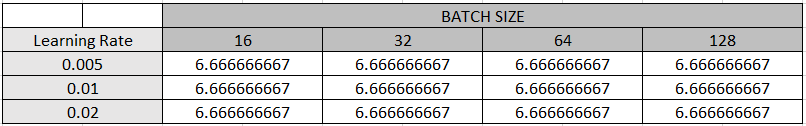

- We had an interesting result with really low change on our loss and no change on our accuracy at all. Again this might be a result from our choice of implementation of the activation functions.
- The model had the same result while predicting the test data

In [36]:
activation_func = "relu"
run(activation_func, LAYER_DIMS)


2-Layer Model is being trained
Batch size: 16
Activation function: relu
Learning rate: 0.005
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 5.766666666666667	Total Loss: 2537.4429924988617
Epoch 2/10	Accuracy: 7.233333333333333	Total Loss: 2537.4428109115747
Epoch 3/10	Accuracy: 8.133333333333333	Total Loss: 2537.442624564592
Epoch 4/10	Accuracy: 7.966666666666667	Total Loss: 2537.442426421073
Epoch 5/10	Accuracy: 8.2	Total Loss: 2537.4421989866196
Epoch 6/10	Accuracy: 8.433333333333334	Total Loss: 2537.4419214534764
Epoch 7/10	Accuracy: 9.1	Total Loss: 2537.441578998375
Epoch 8/10	Accuracy: 9.3	Total Loss: 2537.4411609381877
Epoch 9/10	Accuracy: 9.733333333333333	Total Loss: 2537.440650762422
Epoch 10/10	Accuracy: 9.7	Total Loss: 2537.44000128309

2-Layer Model is being trained
Batch size: 16
Activation function: relu
Learning rate: 0.01
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 7.133333333333334	Total Loss: 2537.4429086591012
Epoch 2/10	Accuracy: 8.0	Total Los

Epoch 4/10	Accuracy: 5.8	Total Loss: 316.841857975477
Epoch 5/10	Accuracy: 5.9	Total Loss: 316.8418523416028
Epoch 6/10	Accuracy: 6.133333333333334	Total Loss: 316.8418467426184
Epoch 7/10	Accuracy: 6.566666666666666	Total Loss: 316.841841110153
Epoch 8/10	Accuracy: 7.133333333333334	Total Loss: 316.8418354931099
Epoch 9/10	Accuracy: 7.733333333333333	Total Loss: 316.84182982148087
Epoch 10/10	Accuracy: 7.733333333333333	Total Loss: 316.84182403135827

2-Layer Model is being trained
Batch size: 128
Activation function: relu
Learning rate: 0.02
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.1	Total Loss: 316.8418744153788
Epoch 2/10	Accuracy: 5.7	Total Loss: 316.8418610969287
Epoch 3/10	Accuracy: 6.066666666666666	Total Loss: 316.8418499401552
Epoch 4/10	Accuracy: 7.233333333333333	Total Loss: 316.8418385871296
Epoch 5/10	Accuracy: 7.733333333333333	Total Loss: 316.84182721133567
Epoch 6/10	Accuracy: 8.166666666666666	Total Loss: 316.84181537130775
Epoch 7/10	Accuracy: 8.1666

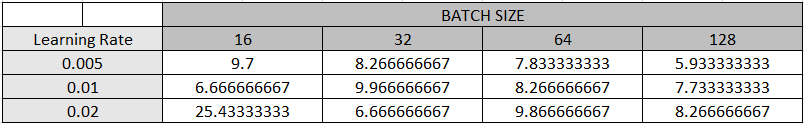

- Seems like, ReLU activation function has *usually* positive effect from lower batch size and higher learning rate.
- The best model has 25.4% accuracy with validation data and 24.6% accuracy with the test data

In [37]:
activation_func = "tanh"
run(activation_func, LAYER_DIMS)


2-Layer Model is being trained
Batch size: 16
Activation function: tanh
Learning rate: 0.005
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.333333333333333	Total Loss: 2537.4430469088375
Epoch 2/10	Accuracy: 6.033333333333333	Total Loss: 2537.4428155136866
Epoch 3/10	Accuracy: 8.3	Total Loss: 2537.44259803141
Epoch 4/10	Accuracy: 8.833333333333334	Total Loss: 2537.442363822075
Epoch 5/10	Accuracy: 9.566666666666666	Total Loss: 2537.442096296452
Epoch 6/10	Accuracy: 10.333333333333334	Total Loss: 2537.4417875721883
Epoch 7/10	Accuracy: 11.1	Total Loss: 2537.4414128392723
Epoch 8/10	Accuracy: 11.366666666666667	Total Loss: 2537.4409392552675
Epoch 9/10	Accuracy: 9.633333333333333	Total Loss: 2537.4403245467797
Epoch 10/10	Accuracy: 8.0	Total Loss: 2537.439505095728

2-Layer Model is being trained
Batch size: 16
Activation function: tanh
Learning rate: 0.01
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.133333333333334	Total Loss: 2537.4429280813592
Epoch 2/10	Accur

Epoch 6/10	Accuracy: 5.3	Total Loss: 316.84184928498473
Epoch 7/10	Accuracy: 5.366666666666666	Total Loss: 316.8418430280755
Epoch 8/10	Accuracy: 6.2	Total Loss: 316.8418367192528
Epoch 9/10	Accuracy: 6.433333333333334	Total Loss: 316.8418303118225
Epoch 10/10	Accuracy: 7.066666666666666	Total Loss: 316.841823763255

2-Layer Model is being trained
Batch size: 128
Activation function: tanh
Learning rate: 0.02
Layer dims: [14400, 256, 128, 15]

Epoch 1/10	Accuracy: 6.7	Total Loss: 316.84188048253895
Epoch 2/10	Accuracy: 6.3	Total Loss: 316.84186627004294
Epoch 3/10	Accuracy: 5.366666666666666	Total Loss: 316.84185264781576
Epoch 4/10	Accuracy: 6.0	Total Loss: 316.84183967968875
Epoch 5/10	Accuracy: 6.966666666666667	Total Loss: 316.8418265736719
Epoch 6/10	Accuracy: 8.0	Total Loss: 316.84181287092264
Epoch 7/10	Accuracy: 8.2	Total Loss: 316.841798398363
Epoch 8/10	Accuracy: 8.7	Total Loss: 316.8417829556814
Epoch 9/10	Accuracy: 9.033333333333333	Total Loss: 316.8417663807256
Epoch 10/10	

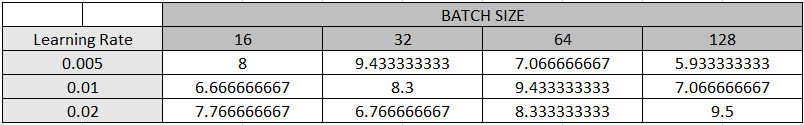

- Increasing the batch size or the learning rate has a mixed effect on the 2-Layer Tanh models
- The best model has 9.4% accuracy with validation data and 8.6% accuracy with the test data

### General Conculusions
- It looks like **higher** layer number didn't improve models performance overall. Compare to 1-Layer and 0-Layer implementations, we got much worse results with every activation functions.
- This might be caused by the node numbers that we picked. "14400, 256, 64, 15". Changing the node number 256, 64 and tuning the model further can most likely increase the accuracy results.
- While increasing batch size and learning rate have mix results on models, our best model with 2-Layers is trained with ReLU activation function, 0.02 Learning rate and 16 batch size.
- Among the activation functions, ReLU again dominates, but this doesn't necessarily means it is always the best. Since we only trained models for 10 epoch, we think that some activation functions may not have showed their potential due to initial epochs.

In [72]:
# Saving the best model
max_acc = 0
best_model = None
for model in best_models:
    if max_acc < model.avg_acc:
        best_model = model
        
save(best_model, name="best-model")

### 1.2.2. Conclusion About Different Model Settings

In our tried settings, with 0-Layer models we have exactly the same results. The reason is since we do not have any activation between input and output, models uses only softmax function for every time. We also see that usually **ReLU** function dominates other functions. At the same time, we also see that as we increase model's complexity (architechture etc.) models again with **ReLU** function seems to perform better. Hence we get the intuition that **ReLU** function works better overall.

Another thing to talk about is how to accuracy changes as we increase model's complexity. We see that as we increase the model complexity validation accuracy overall seems to decrease. This shows that increasing model complexity seems not helping with vegatable classification from image task. This might be a result from the given data (When the data is not a good fit to train a neural network) or the implementation of the activation functions and the tunings that were made to prevent the errors.

### 1.3. Training Best Model
#### 1.3.1 Load the Best Model

In [19]:
best_model = load_model("best-model")
print()
best_model.display()

Trying to load model files from previous saves

Layer settings: [14400, 256, 15]
Learning rate: 0.02
Number of Epoch: 10
Batch Size: 16
Layer Activation: relu
Last Layer Activation: softmax
Decay rate: 0.998


#### 1.3.2 Training the Best Model

We now train this model for 100 epochs to overfit it to training set and visualize weights.<br>

In [20]:
train_X, train_Y = read(data_set_folder="Vegetable Images", mode="train")
valid_X, valid_Y = read(data_set_folder="Vegetable Images", mode="validation")
test_X, test_Y = read(data_set_folder="Vegetable Images", mode="test")

best_model.num_epoch = 100
best_model.init_params()
accuracy_list, loss_list = best_model.train(train_X, train_Y, valid_X, valid_Y)

Trying to load train files from previous saves
Trying to load validation files from previous saves
Trying to load test files from previous saves
Epoch 1/100	Accuracy: 18.4	Total Loss: 2429.746950091939
Epoch 2/100	Accuracy: 25.766666666666666	Total Loss: 2248.6610885929185
Epoch 3/100	Accuracy: 28.266666666666666	Total Loss: 2081.771923748219
Epoch 4/100	Accuracy: 33.4	Total Loss: 1933.2655725578363
Epoch 5/100	Accuracy: 39.93333333333333	Total Loss: 1806.2548308441558
Epoch 6/100	Accuracy: 41.96666666666667	Total Loss: 1699.0168760899808
Epoch 7/100	Accuracy: 43.13333333333333	Total Loss: 1601.8833036414367
Epoch 8/100	Accuracy: 44.63333333333333	Total Loss: 1511.9912926296029
Epoch 9/100	Accuracy: 45.13333333333333	Total Loss: 1432.895087429248
Epoch 10/100	Accuracy: 43.233333333333334	Total Loss: 1363.2262646982547
Epoch 11/100	Accuracy: 46.96666666666667	Total Loss: 1292.5715791396535
Epoch 12/100	Accuracy: 46.96666666666667	Total Loss: 1231.5599348121325
Epoch 13/100	Accuracy: 47.

In [44]:
# Testing the best model after 100 epoch with test data
predictions = best_model.predict(test_X, test_Y)

Accuracy: 60.6


In [45]:
# Saving the best model after 100 epoch in case we need it back
save(best_model, name="best-model-100-epoch")

#### 1.3.3 Plotting Loss and Accuracy for Best Model
Below we plot the average training accuracy and average loss over epochs.
1. We see that our average training loss drops in each epoch and it converges. Thus we can say that it learns the objective function.
2. In our accuracy plot, accuracy increases with each epoch with minor exceptions, resulting in %60 accuracy at the 100th epoch. As we tested with our test data, it's accuracy increased to 60% as well.

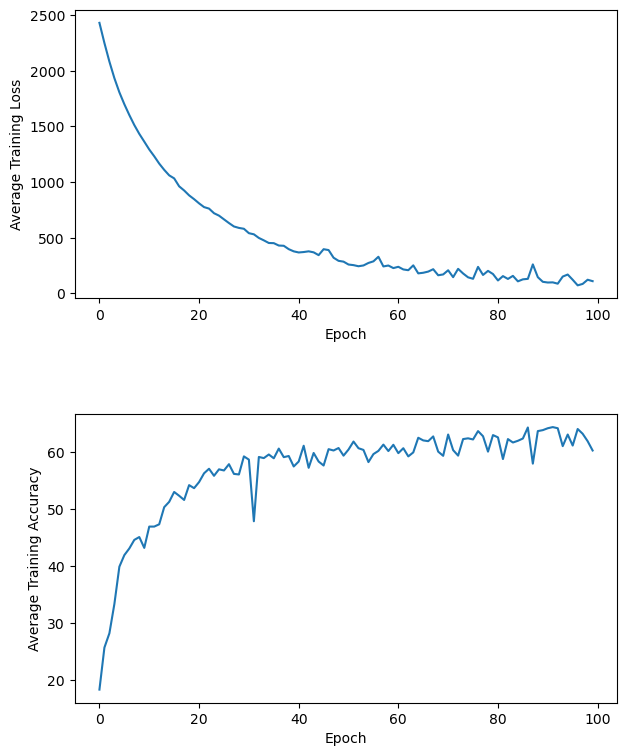

In [21]:
draw_graphs(accuracy_list, loss_list)

### 1.4. Visualization of Weights
Below we visualise the weights of our trained best model. We visualize the weights in the following manner:<br>

In [87]:
def visualize(weights, x, y):
    W, D = weights.shape
    W = int(round(np.sqrt(W)))
    reshaped_weights = weights.reshape(W, W, 1, D)

    fig, axs = plt.subplots(x, y)
    fig.set_size_inches(32, 32)
    index = 0
    for i in range(x):
        for j in range(y):
            axs[i, j].imshow(reshaped_weights[:, :, :, index], interpolation='nearest', cmap='gray')
            axs[i, j].axis('off')
            index += 1
    plt.subplots_adjust(wspace=0.01, hspace=0.01)

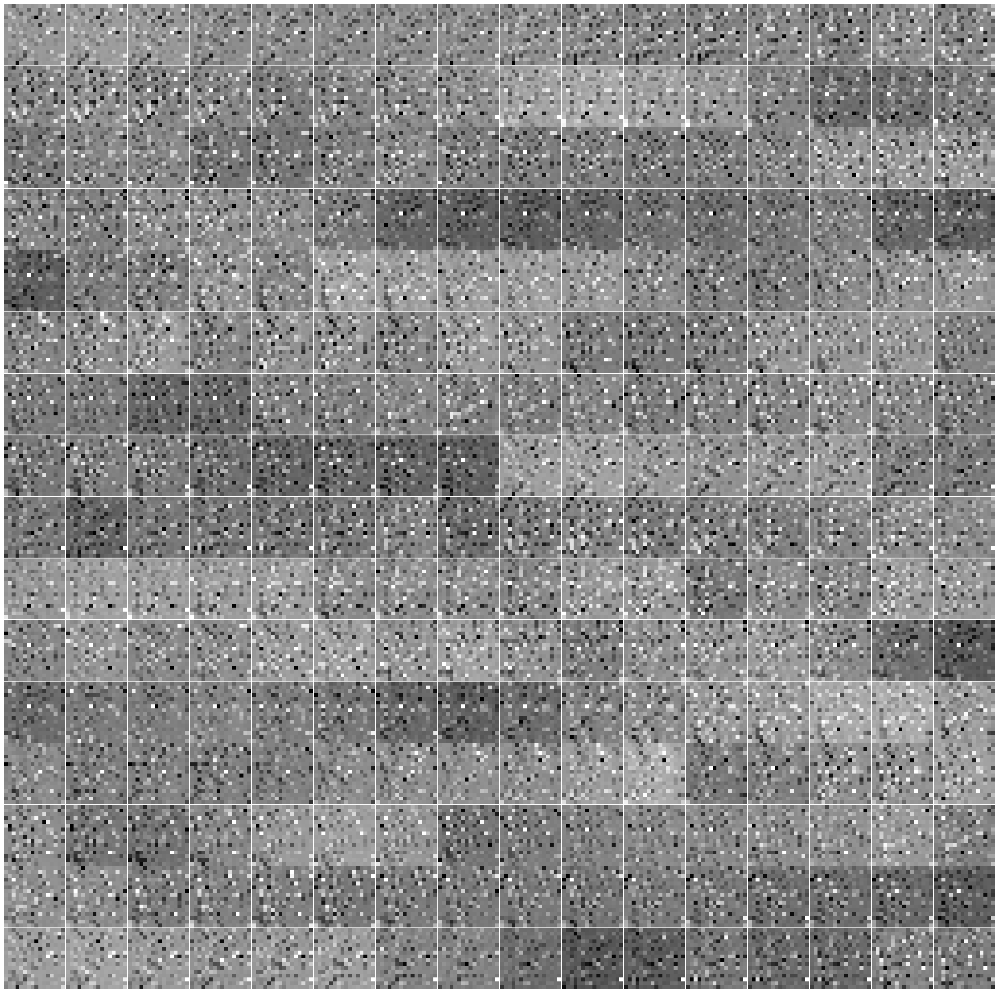

In [88]:
params = best_model.params
weights = params["W1"]

visualize(weights, 16, 16)

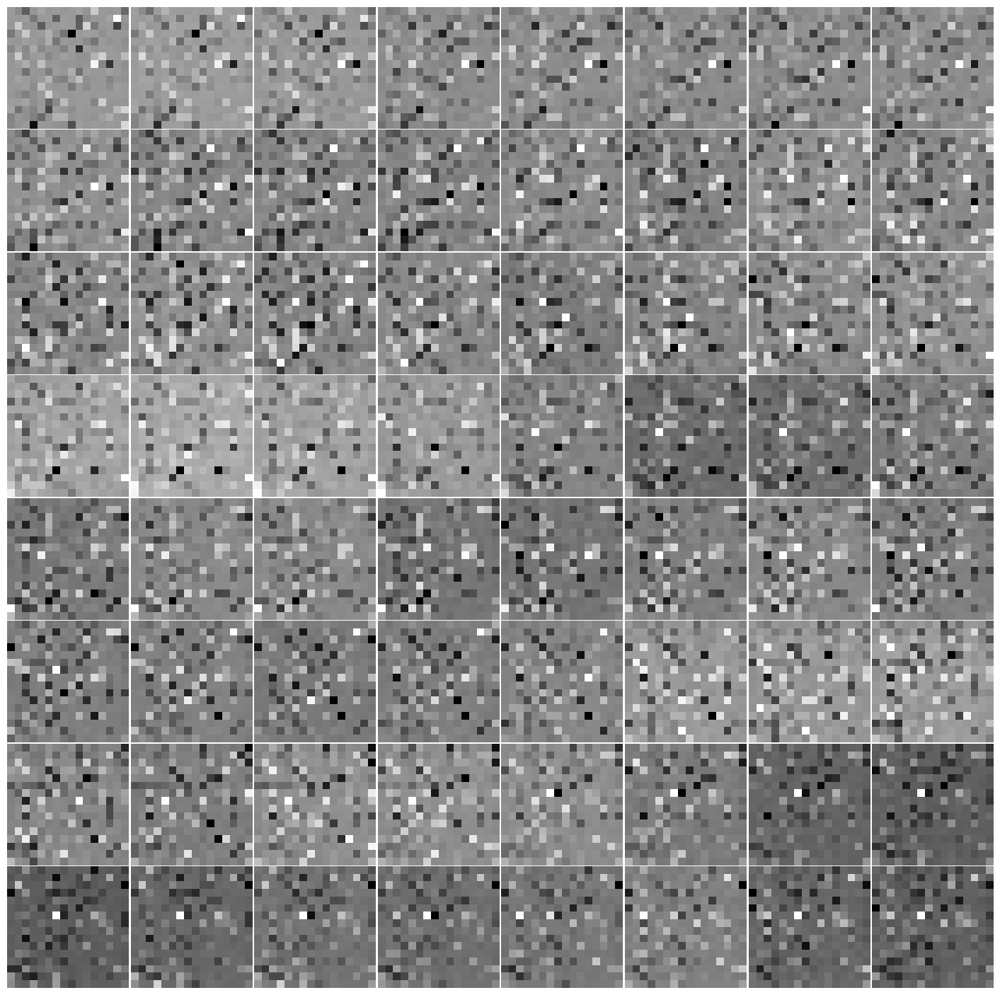

In [78]:
weights = params["W2"]

visualize(weights, 8, 8)

In [23]:
from sklearn.metrics import classification_report

predictions = best_model.predict(test_X, test_Y)
print("Test Loss:\t", np.sum(loss_list))
print(classification_report(test_Y, predictions))

Accuracy: 60.6
Test Loss:	 52564.65076393336
              precision    recall  f1-score   support

           0       0.54      0.48      0.51       200
           1       0.50      0.60      0.55       200
           2       0.68      0.83      0.75       200
           3       0.67      0.50      0.57       200
           4       0.81      0.41      0.54       200
           5       0.50      0.58      0.54       200
           6       0.67      0.71      0.69       200
           7       0.69      0.68      0.69       200
           8       0.53      0.63      0.58       200
           9       0.88      0.52      0.65       200
          10       0.60      0.72      0.66       200
          11       0.52      0.73      0.61       200
          12       0.70      0.63      0.66       200
          13       0.64      0.71      0.68       200
          14       0.41      0.34      0.37       200

    accuracy                           0.61      3000
   macro avg       0.62      0.61  

## Part 2: Convolutional Neural Network (CNN)

- Since our graphics cards do not support CUDA and we could not run this notebook on our local computers, we had to use google collab and it's cuda feature in order to save time. Therefore we will paste the Jupyter notebook file from Google Colab directly.
- Since we used Google Collab, we imported the image data by using Kaggle's API

### Important Note
- Since the image outputs were too large, we could not include Part 2 in our submit system.
- With the part 2, it was around 18MB
- So, since we also run our code in Google Colab, we included the link from them in the submit system.
- We will send the version with both parts as an e-mail

- Here is the link to our original notebook that we have worked on using google collab: https://colab.research.google.com/drive/1_pgJoDCy6SaB7aNIo5FAlAAW83Ij8i9p?usp=sharing
- Please make sure that you are logged in because collab does not show the pictures with big size
- In case, you can also reach the report where both parts are included from this link as well: https://drive.google.com/drive/folders/1HIVDvYVX-LBYhn18uuhhCZt71gnrnNZe?usp=sharing

In this part of the assignment, we will use pretrained VGG-19 convolutional neural network (CNN) and finetune this network to classify the input images. For this part we will make use of pytorch libraries

We are going to examine two different cases when finetuning the CNN network:
1. We will finetune the weights of all layers in the VGG-19 network.
2. We will finetune the weights of only two last fully connected (FC1 and FC2) layers

<hr>
<h1>Importing Dataset From Kaggle</h1>

In [ ]:
!pip install kaggle
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
mkdir: cannot create directory ‘/root/.kaggle’: File exists


In [ ]:
#Above cell and the below cell are for downloading the dataset from kaggle and using it for the sake of our homework
! kaggle datasets download misrakahmed/vegetable-image-dataset
! unzip vegetable-image-dataset

Görüntülenen çıkış son 5000 satıra kısaltıldı.
  inflating: Vegetable Images/train/Radish/0001.jpg  
  inflating: Vegetable Images/train/Radish/0002.jpg  
  inflating: Vegetable Images/train/Radish/0003.jpg  
  inflating: Vegetable Images/train/Radish/0004.jpg  
  inflating: Vegetable Images/train/Radish/0005.jpg  
  inflating: Vegetable Images/train/Radish/0006.jpg  
  inflating: Vegetable Images/train/Radish/0007.jpg  
  inflating: Vegetable Images/train/Radish/0008.jpg  
  inflating: Vegetable Images/train/Radish/0009.jpg  
  inflating: Vegetable Images/train/Radish/0010.jpg  
  inflating: Vegetable Images/train/Radish/0011.jpg  
  inflating: Vegetable Images/train/Radish/0012.jpg  
  inflating: Vegetable Images/train/Radish/0013.jpg  
  inflating: Vegetable Images/train/Radish/0014.jpg  
  inflating: Vegetable Images/train/Radish/0015.jpg  
  inflating: Vegetable Images/train/Radish/0016.jpg  
  inflating: Vegetable Images/train/Radish/0017.jpg  
  inflating: Vegetable Images/train

In [ ]:
#all the imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import torch
import torch.nn as nn
import torchvision
from torchvision import transforms,models
from torch.utils.data import DataLoader
from tqdm.notebook import tqdm_notebook
from IPython.core.display import HTML,display
from PIL import Image
from torch.utils.data import random_split
from torch.optim import SGD
import torch.optim as optim
from torchvision.datasets import ImageFolder
from tqdm import tqdm
import numpy as np
from sklearn.metrics import classification_report

Now it is time to import the Vgg19 from pytorch library. And finetune it according to the specifications in our homework pdf

Below cells are for defining the train, validation and test paths. Since we might need the names and length of the classes we should create a list called classes in order to use it in our next steps

In [ ]:
train_path=('/content/Vegetable Images/train')
validation_path=('/content/Vegetable Images/validation')
test_path=('/content/Vegetable Images/test')

In [ ]:
classes = os.listdir(train_path)
classes

['Broccoli',
 'Carrot',
 'Capsicum',
 'Pumpkin',
 'Cabbage',
 'Potato',
 'Bottle_Gourd',
 'Radish',
 'Papaya',
 'Bean',
 'Bitter_Gourd',
 'Brinjal',
 'Cauliflower',
 'Cucumber',
 'Tomato']

<hr>
<h1>Creating & Modifying the Model</h1>

In [ ]:
#creating the model
model=torchvision.models.vgg19(pretrained=True)

/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.8/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Let us see the default specifications of the VGG19 model

In [ ]:
print(model)

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padd

<hr>

**As you can see last line indicates that the model has out_features=1000. Since the number of classes in our case is 15, we should tune it accordingly first**

In [ ]:
#This is the implementation for our own VGG19Model

class VGG19(nn.Module):
    def __init__(self, my_pretrained_model, num_class = 15):
        super(VGG19, self).__init__()
        self.pretrained = my_pretrained_model
        # modify last layer to match number of classes
        #Since the model itself has 6 layers and the number of outputs are related with the last layer we have to modify it according to our dataset
        in_nc = self.pretrained.classifier[6].in_features
        
        self.pretrained.classifier[6] = nn.Linear(in_nc, num_class)
    
    def forward(self, x):
        return self.pretrained(x)


**Now It is time to read the dataset and preprocess our data**

In [ ]:
#Creating a pretrained model in order to use with our VGG19 class implementation
pretrained_model = torchvision.models.vgg19(pretrained=True)

#Transforming part
transform = transforms.Compose(
    [
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]
)


#Creating datasets for train validation and test data
train_data=torchvision.datasets.ImageFolder(root=train_path,transform=transform)
val_data=torchvision.datasets.ImageFolder(root=validation_path,transform=transform)
test_data=torchvision.datasets.ImageFolder(root=test_path,transform=transform)

#getting sizes of datasets
train_size = len(train_data)
val_size = len(val_data)
test_size = len(test_data)

#checkin the sizes and making sure we are working with cuda instead of cpu in order to perform operations faster
print(train_size, val_size, test_size)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

15000 3000 3000
cuda


<h1>Train Function</h1>

Below is the function for training our model

In [ ]:
def train_vgg_model(model, optimizer, criterion, train_data_loader, val_data_loader, epoch_count):
    for epoch in range(epoch_count):  # loop over the dataset multiple times
        print("Epoch %d/%d #####################" % (epoch + 1, EPOCH_COUNT))


        #training part
        running_loss_train = 0.0
        running_true_train = 0
        
        
        model.train()
        
        for i, data in tqdm(enumerate(train_data_loader, 0), leave=False, total=len(train_data_loader)):
            # get the inputs; data is a list of [inputs, labels]
            inputs, labels = data
            inputs = inputs.to(device)
            labels = labels.to(device)
            # zero the parameter gradients

            optimizer.zero_grad()

            
            # forward + backward + optimize
            
            outputs = model(inputs)
            pred = torch.argmax(outputs, dim=1)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            # print statistics
            
            running_loss_train += loss.item()
            running_true_train += torch.sum(pred == labels)

        train_loss = running_loss_train / train_size
        train_acc = running_true_train / train_size
        print("Training accuracy %f\tTraining average loss %f" % (train_acc, train_loss))

        ## VALIDATION PHASE ##
        running_loss_validation = 0.0
        running_true_validation = 0
        model.eval()
        with torch.no_grad():
            for i, data in enumerate(validation_data_loader, 0):
                # get the inputs; data is a list of [inputs, labels]
                inputs, labels = data
                inputs = inputs.to(device)
                labels = labels.to(device)

                # forward + backward + optimize
                outputs = model(inputs)
                pred = torch.argmax(outputs, dim=1)
                loss = criterion(outputs, labels)

                # print statistics
                running_loss_validation += loss.item()
                running_true_validation += torch.sum(pred == labels)

        val_loss = running_loss_validation / val_size
        val_acc = running_true_validation / val_size
        print("Validation accuracy %f\Validation average loss %f" % (val_acc, val_loss))

    print('Finished Training')

<h1> Finetuning the Model </h1>

#### 1- Finetuning the Weights of All Layers

For the first case, we finetune the weights of all layers by writing `param.requires_grad = True` in a for loop. We used optimizer as SGD, learning rate as 0.0001 and for the loss function we used CrossEntropyLoss(). We first trained the model with >=10 epoches but we realized that 3-4 epoches are enough to get a good number in terms of accuracy. Therefore we decided to train our model with 3 epoches. In order to save time. We used 128 as a batch size as well.

In [ ]:
#creating a model from our vgg19 class which is defined above

model = VGG19(pretrained_model)
for param in model.parameters():
    param.requires_grad = True
model.cuda()


optimizer = torch.optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)
criterion = nn.CrossEntropyLoss()
EPOCH_COUNT = 3
batch_size = 128

#creating loaders for train validation and test datasets
train_data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
validation_data_loader = DataLoader(val_data, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)

#running training
train_vgg_model(model, optimizer, criterion, train_data_loader, validation_data_loader, EPOCH_COUNT)

Epoch 1/3 #####################


Training accuracy 0.589667	Training average loss0.011117
Validation accuracy 0.968667\Validation average loss0.001241
Epoch 2/3 #####################


Training accuracy 0.944600	Training average loss0.001494
Validation accuracy 0.989000\Validation average loss0.000409
Epoch 3/3 #####################


Training accuracy 0.971400	Training average loss0.000750
Validation accuracy 0.993333\Validation average loss0.000208
Finished Training


In order to get our confusion matrix Confusion Matrix, we use our trained model on test set, save the predictions and print the results.

In [ ]:
y_pred = []
y_test = []
model.eval()
with torch.no_grad():
    for i, data in tqdm(enumerate(test_data_loader, 0), total=len(test_data_loader), leave=False):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # forward + backward + optimize
        outputs = model(inputs)
        pred = torch.argmax(outputs, dim=1)

        # print statistics
        y_pred.extend(pred.cpu().numpy())
        y_test.extend(labels.cpu().numpy())

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_pred, y_test, labels=np.arange(15)))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       208
           1       0.99      0.99      0.99       199
           2       0.99      1.00      1.00       199
           3       1.00      0.97      0.98       207
           4       0.98      1.00      0.99       196
           5       0.99      0.99      0.99       200
           6       0.99      0.99      0.99       199
           7       1.00      1.00      1.00       201
           8       0.98      0.99      0.99       198
           9       0.99      0.99      0.99       199
          10       0.98      0.99      0.99       197
          11       1.00      1.00      1.00       200
          12       1.00      1.00      1.00       200
          13       1.00      1.00      1.00       200
          14       0.98      1.00      0.99       197

    accuracy                           0.99      3000
   macro avg       0.99      0.99      0.99      3000
weighted avg       0.99   

As you can see above. Our model has 1.00 accuracy recall and f1-score for 3 of the classes. And very high metrics for other classes as well. As you can imagine some of the vegatables look very similar with each other. Therefore our model might have get confused differentiating between those vegatable classes. But overall, our metrics are highly acceptable considering the fact that we got 0.60 accuracy in first part.

#### Finetuning the Weights of Only Two Last Fully Connected (FC1 and FC2) Layers

For the second part, we finetune the weights of only last two fully connected layers (FC1 and FC2) instead of all layers.

In order to achive this we have to abort all layers then, activate again the last two layers. We used optimizer as SGD, learning rate as 0.0001 and for the loss function we used CrossEntropyLoss(). We trained our model with 3 epoches. Because it was enough to get high accuracy like we mentioned above.


In [ ]:
model_2 = VGG19(pretrained_model)
model_2.cuda()

## Omit all the layers
for param in model_2.parameters():
    param.requires_grad = False



##Then train the last two layers
for layer in model_2.pretrained.classifier[3:]:
    for param in layer.parameters():
        param.requires_grad = True


optimizer = optim.SGD(model.parameters(), lr=0.0001, momentum=0.9)
criterion = nn.CrossEntropyLoss()
EPOCH_COUNT = 3
batch_size = 128
train_data_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
validation_data_loader = DataLoader(val_data, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_data, batch_size=batch_size, shuffle=True)
train_vgg_model(model_2, optimizer, criterion, train_data_loader, validation_data_loader, EPOCH_COUNT)

Epoch 1/3 #####################


Training accuracy 0.845267	Training average loss0.004405
Validation accuracy 0.990667\Validation average loss0.000386
Epoch 2/3 #####################


Training accuracy 0.968333	Training average loss0.000846
Validation accuracy 0.993000\Validation average loss0.000287
Epoch 3/3 #####################


Training accuracy 0.976933	Training average loss0.000619
Validation accuracy 0.992667\Validation average loss0.000235
Finished Training


In [ ]:
y_pred = []
y_test = []
model_2.eval()
with torch.no_grad():
    for i, data in tqdm(enumerate(test_data_loader, 0), total=len(test_data_loader), leave=False):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data
        inputs = inputs.to(device)
        labels = labels.to(device)

        # forward + backward + optimize
        outputs = model_2(inputs)
        pred = torch.argmax(outputs, dim=1)

        # print statistics
        y_pred.extend(pred.cpu().numpy())
        y_test.extend(labels.cpu().numpy())

print(classification_report(y_pred, y_test, labels=np.arange(15)))

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       208
           1       0.99      0.99      0.99       200
           2       1.00      1.00      1.00       200
           3       0.99      0.98      0.99       202
           4       0.97      1.00      0.98       194
           5       0.99      0.99      0.99       200
           6       0.99      1.00      1.00       199
           7       0.99      1.00      0.99       198
           8       0.98      0.99      0.99       199
           9       0.99      1.00      0.99       198
          10       0.99      0.99      0.99       202
          11       1.00      0.99      1.00       202
          12       1.00      1.00      1.00       201
          13       1.00      1.00      1.00       200
          14       0.98      1.00      0.99       197

    accuracy                           0.99      3000
   macro avg       0.99      0.99      0.99      3000
weighted avg       0.99   

As you can see above this model has 1.00 acc, precison and recall for 2 classes. Even though it is slighty worse than finetuning all layers it is definetly acceptable. But in our case finetuning the weight of last two layers did not do wonders for us. It might be because of the dataset we use. But while using other datasets it might be helpful. Therefore we should try and experience it ourselves.

<hr>
<h1>Visualization </h1>

In [ ]:
#imports for visualization part
import torch.nn.functional as F

import torchvision.transforms as transforms
import torchvision.datasets as dataset

import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv

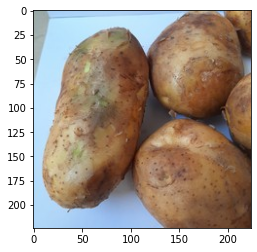

torch.Size([1, 3, 224, 224])


In [ ]:
img=cv.imread('/content/Vegetable Images/test/Potato/1088.jpg')
#we have chosen the image above randomly to show how our layers affect it.

#plotting the image using matplotlib
img=cv.cvtColor(img,cv.COLOR_BGR2RGB)
plt.imshow(img)
plt.show()


transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])
img=np.array(img)
img=transform(img)
img=img.unsqueeze(0)
print(img.size())

In [ ]:
no_of_layers=0
conv_layers=[]

model.to(device)
model_children=list(model.children())

#getting convolutional layers
for x in model_children:
    for a in (x.features.to(device)):
        if type(a)==nn.Conv2d:
            no_of_layers+=1
            conv_layers.append(a.to(device))
        elif type(a)==nn.Sequential:
            for layer in a.children():
                if type(layer)==nn.Conv2d:
                no_of_layers+=1
                conv_layers.append(layer.to(device))

16


In [ ]:
#device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [ ]:
results = [conv_layers[0](img)]
for i in range(1, len(conv_layers)):
    results.append(conv_layers[i](results[-1]))
outputs = results

Layer  1


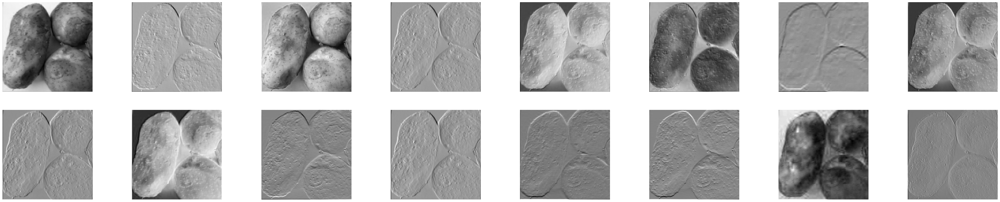

Layer  2


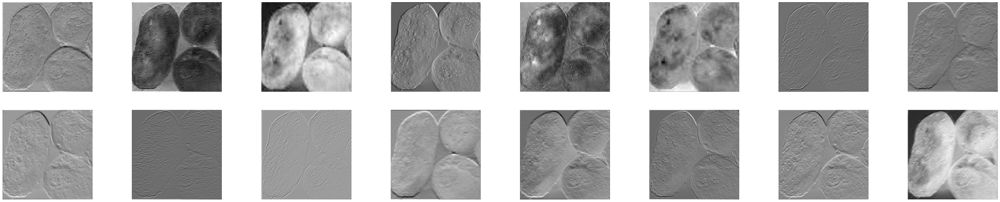

Layer  3


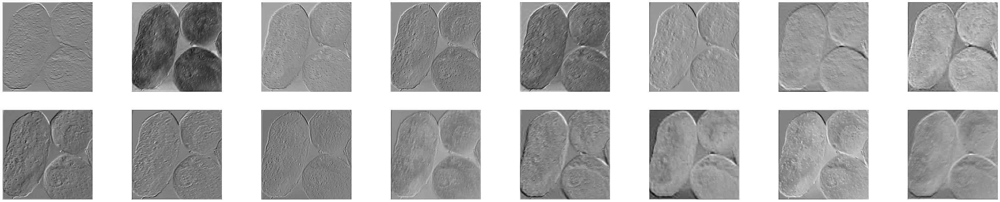

Layer  4


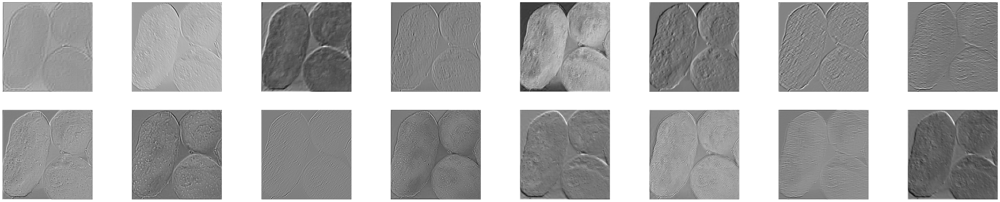

Layer  5


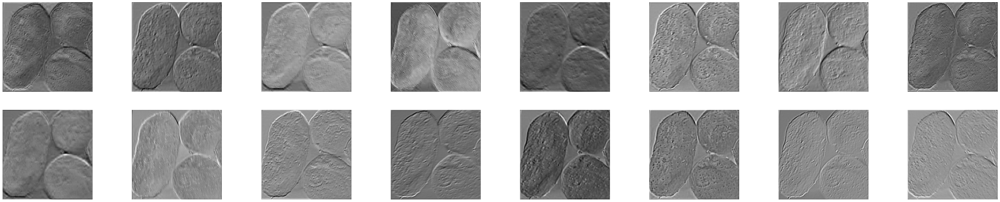

Layer  6


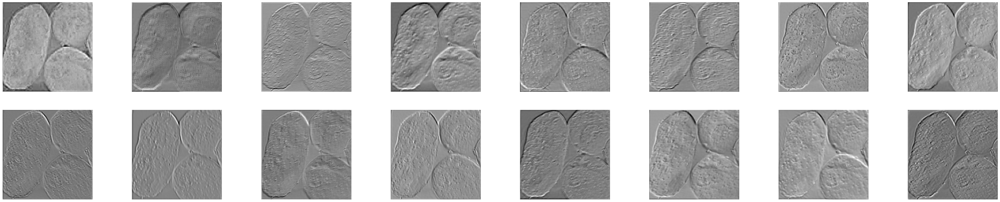

Layer  7


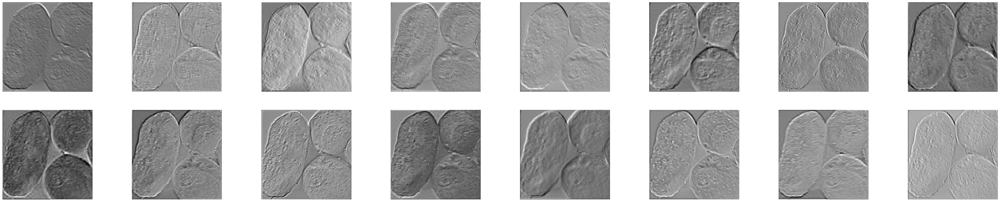

Layer  8


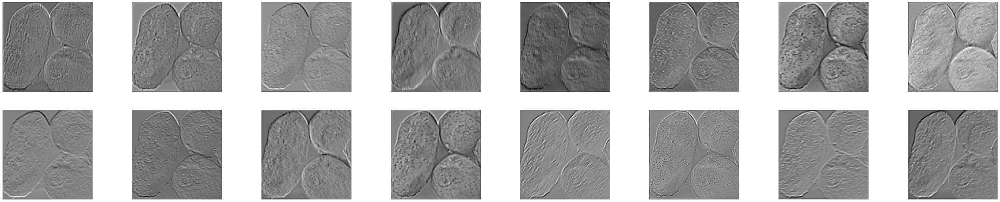

Layer  9


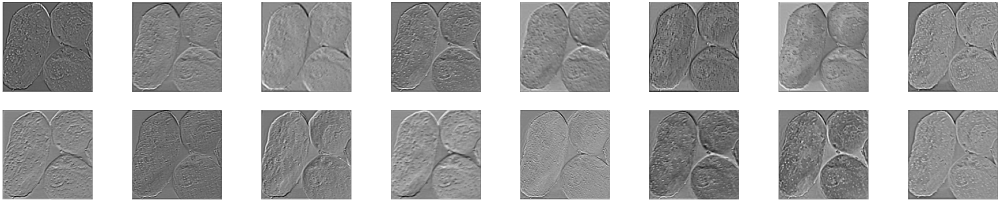

Layer  10


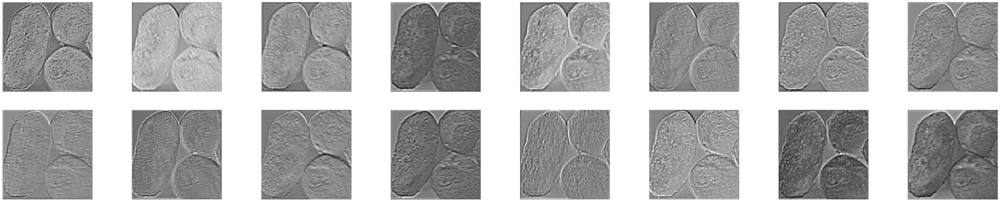

Layer  11


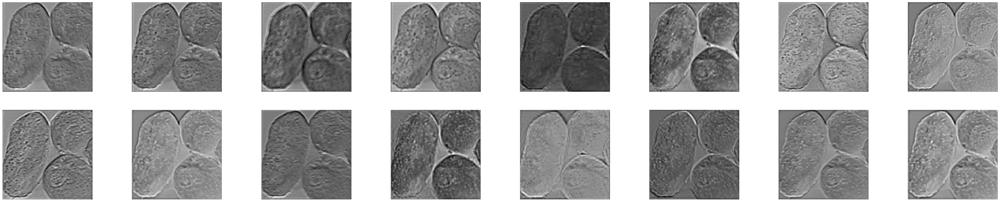

Layer  12


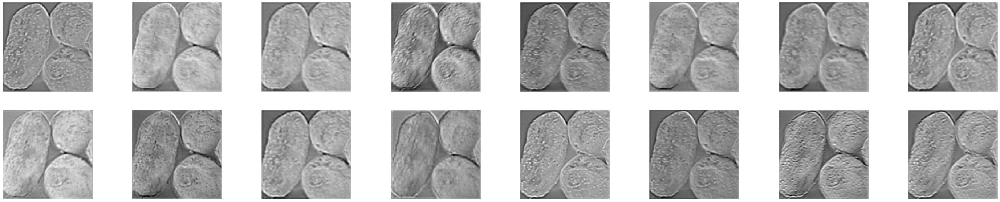

Layer  13


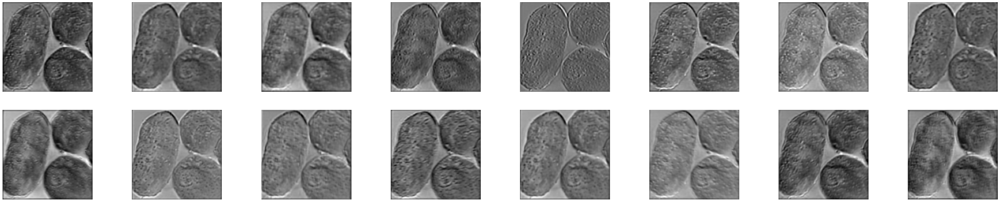

Layer  14


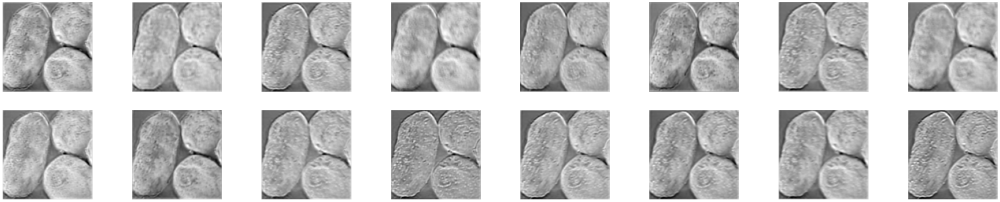

Layer  15


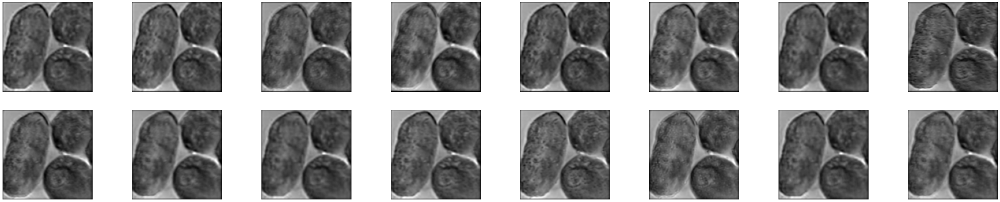

Layer  16


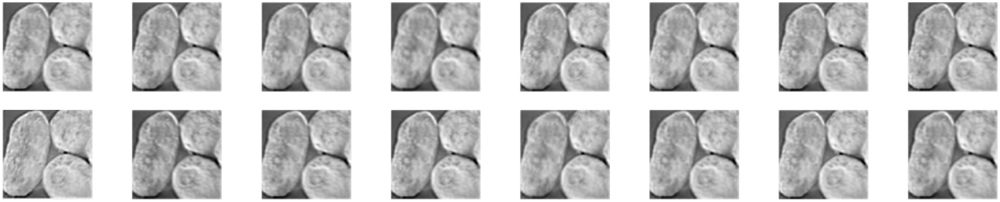

In [ ]:
#applying each conv layer and plotting them using matplotlib
for num_layer in range(len(outputs)):
    plt.figure(figsize=(50, 10))
    layer_viz = outputs[num_layer][0, :, :, :]
    layer_viz = layer_viz.data
    print("Layer ",num_layer+1)
    for i, filter in enumerate(layer_viz):
        if i == 16: 
            break
        plt.subplot(2, 8, i + 1)
        plt.imshow(filter, cmap='gray')
        plt.axis("off")
    plt.show()
    plt.close()

<h1> Comparison: Neural Network vs VGG-19

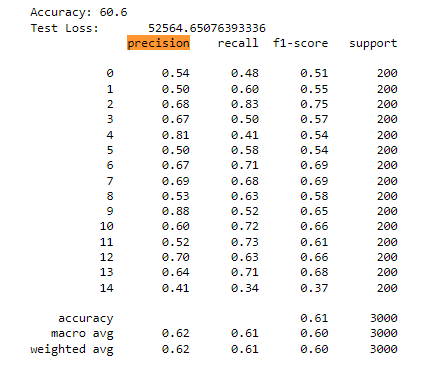

Above is the confusion matrix for part 1

And below are the confusion matrices for part 2

#### 1- Finetuning All Layers
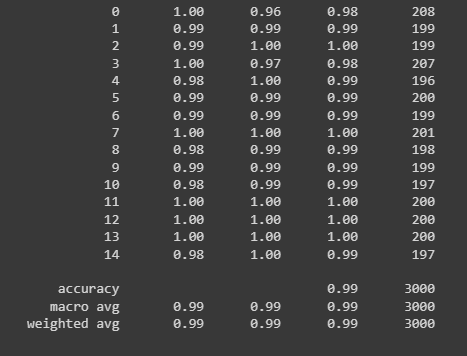


<hr>

#### 2- Finetuning Last 2 Layers
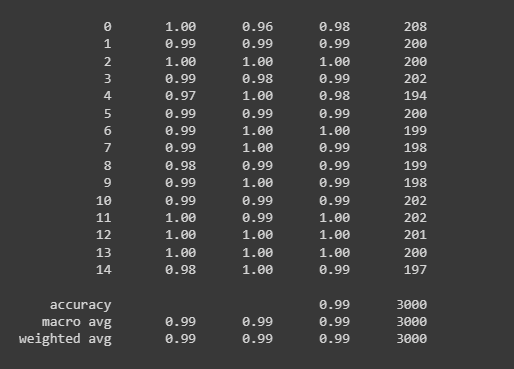

As you can see from the confusion matrices above it is pretty clear that our part 2 works better with our dataset. It has better accuracy, better precison and better recall. The difference is big.

NN treats each element in input vector equally. Which means that we cannot give more meaning to some pixels of our picture. In other words, we cannot give particular weights to pixels. We might need such operations in order to differentiate easily between 2 classes.

Let's imagine a scenario where we want to differentiate between two vegatable classes by looking at the shape of a vegatable. For instance a tomato has a round shape but a cucumber is like a fat stick. To differentiate between these two we have to give different weights to pixels which represent the shape. But unfortunately this is not possible with NN. But we can perform the intented operation above using CNN.

For the reasons above CNN works better with visual inputs like images and videos for classification

